# Zomato Case Study

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data Cleaning and Preparation

In [2]:
data = pd.read_csv('zomato_restaurants_in_India.csv')

In [3]:
data.head()

,res_id,name,establishment,url,address,city,city_id,locality,latitude,longitude,...,price_range,currency,highlights,aggregate_rating,rating_text,votes,photo_count,opentable_support,delivery,takeaway
0,3400299,Bikanervala,['Quick Bites'],https://www.zomato.com/agra/bikanervala-khanda...,"Kalyani Point, Near Tulsi Cinema, Bypass Road,...",Agra,34,Khandari,27.211450,78.002381,...,2,Rs.,"['Lunch', 'Takeaway Available', 'Credit Card',...",4.4,Very Good,814,154,0.0,-1,-1
1,3400005,Mama Chicken Mama Franky House,['Quick Bites'],https://www.zomato.com/agra/mama-chicken-mama-...,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra,34,Agra Cantt,27.160569,78.011583,...,2,Rs.,"['Delivery', 'No Alcohol Available', 'Dinner',...",4.4,Very Good,1203,161,0.0,-1,-1
2,3401013,Bhagat Halwai,['Quick Bites'],https://www.zomato.com/agra/bhagat-halwai-2-sh...,"62/1, Near Easy Day, West Shivaji Nagar, Goalp...",Agra,34,Shahganj,27.182938,77.979684,...,1,Rs.,"['No Alcohol Available', 'Dinner', 'Takeaway A...",4.2,Very Good,801,107,0.0,1,-1
3,3400290,Bhagat Halwai,['Quick Bites'],https://www.zomato.com/agra/bhagat-halwai-civi...,"Near Anjana Cinema, Nehru Nagar, Civil Lines, ...",Agra,34,Civil Lines,27.205668,78.004799,...,1,Rs.,"['Takeaway Available', 'Credit Card', 'Lunch',...",4.3,Very Good,693,157,0.0,1,-1
4,3401744,The Salt Cafe Kitchen & Bar,['Casual Dining'],https://www.zomato.com/agra/the-salt-cafe-kitc...,"1C,3rd Floor, Fatehabad Road, Tajganj, Agra",Agra,34,Tajganj,27.157709,78.052421,...,3,Rs.,"['Lunch', 'Serves Alcohol', 'Cash', 'Credit Ca...",4.9,Excellent,470,291,0.0,1,-1


In [4]:
print(data.isnull().sum())

res_id                       0
name                         0
establishment                0
url                          0
address                    134
city                         0
city_id                      0
locality                     0
latitude                     0
longitude                    0
zipcode                 163187
country_id                   0
locality_verbose             0
cuisines                  1391
timings                   3874
average_cost_for_two         0
price_range                  0
currency                     0
highlights                   0
aggregate_rating             0
rating_text                  0
votes                        0
photo_count                  0
opentable_support           48
delivery                     0
takeaway                     0
dtype: int64


In [5]:
data.dtypes

res_id                    int64
name                     object
establishment            object
url                      object
address                  object
city                     object
city_id                   int64
locality                 object
latitude                float64
longitude               float64
zipcode                  object
country_id                int64
locality_verbose         object
cuisines                 object
timings                  object
average_cost_for_two      int64
price_range               int64
currency                 object
highlights               object
aggregate_rating        float64
rating_text              object
votes                     int64
photo_count               int64
opentable_support       float64
delivery                  int64
takeaway                  int64
dtype: object

In [6]:
data['price_range'] = pd.to_numeric(data['price_range'], errors='coerce')

In [7]:
data['cuisines'] = data['cuisines'].fillna('Unknown')
data['num_cuisines'] = data['cuisines'].apply(lambda x: len(x.split(',')))
data.head()

,res_id,name,establishment,url,address,city,city_id,locality,latitude,longitude,...,currency,highlights,aggregate_rating,rating_text,votes,photo_count,opentable_support,delivery,takeaway,num_cuisines
0,3400299,Bikanervala,['Quick Bites'],https://www.zomato.com/agra/bikanervala-khanda...,"Kalyani Point, Near Tulsi Cinema, Bypass Road,...",Agra,34,Khandari,27.211450,78.002381,...,Rs.,"['Lunch', 'Takeaway Available', 'Credit Card',...",4.4,Very Good,814,154,0.0,-1,-1,5
1,3400005,Mama Chicken Mama Franky House,['Quick Bites'],https://www.zomato.com/agra/mama-chicken-mama-...,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra,34,Agra Cantt,27.160569,78.011583,...,Rs.,"['Delivery', 'No Alcohol Available', 'Dinner',...",4.4,Very Good,1203,161,0.0,-1,-1,6
2,3401013,Bhagat Halwai,['Quick Bites'],https://www.zomato.com/agra/bhagat-halwai-2-sh...,"62/1, Near Easy Day, West Shivaji Nagar, Goalp...",Agra,34,Shahganj,27.182938,77.979684,...,Rs.,"['No Alcohol Available', 'Dinner', 'Takeaway A...",4.2,Very Good,801,107,0.0,1,-1,2
3,3400290,Bhagat Halwai,['Quick Bites'],https://www.zomato.com/agra/bhagat-halwai-civi...,"Near Anjana Cinema, Nehru Nagar, Civil Lines, ...",Agra,34,Civil Lines,27.205668,78.004799,...,Rs.,"['Takeaway Available', 'Credit Card', 'Lunch',...",4.3,Very Good,693,157,0.0,1,-1,4
4,3401744,The Salt Cafe Kitchen & Bar,['Casual Dining'],https://www.zomato.com/agra/the-salt-cafe-kitc...,"1C,3rd Floor, Fatehabad Road, Tajganj, Agra",Agra,34,Tajganj,27.157709,78.052421,...,Rs.,"['Lunch', 'Serves Alcohol', 'Cash', 'Credit Ca...",4.9,Excellent,470,291,0.0,1,-1,3


## Exploratory Data Analysis (EDA)

In [9]:
data.describe()

,res_id,city_id,latitude,longitude,country_id,average_cost_for_two,price_range,aggregate_rating,votes,photo_count,opentable_support,delivery,takeaway,num_cuisines
count,2.119440e+05,211944.000000,211944.000000,211944.000000,211944.0,211944.000000,211944.000000,211944.000000,211944.000000,211944.000000,211896.0,211944.000000,211944.0,211944.000000
mean,1.349411e+07,4746.785434,21.499758,77.615276,1.0,595.812229,1.882535,3.395937,378.001864,256.971224,0.0,-0.255907,-1.0,2.503487
std,7.883722e+06,5568.766386,22.781331,7.500104,0.0,606.239363,0.892989,1.283642,925.333370,867.668940,0.0,0.964172,0.0,1.509435
min,5.000000e+01,1.000000,0.000000,0.000000,1.0,0.000000,1.000000,0.000000,-18.000000,0.000000,0.0,-1.000000,-1.0,1.000000
25%,3.301027e+06,11.000000,15.496071,74.877961,1.0,250.000000,1.000000,3.300000,16.000000,3.000000,0.0,-1.000000,-1.0,1.000000
50%,1.869573e+07,34.000000,22.514494,77.425971,1.0,400.000000,2.000000,3.800000,100.000000,18.000000,0.0,-1.000000,-1.0,2.000000
75%,1.881297e+07,11306.000000,26.841667,80.219323,1.0,700.000000,2.000000,4.100000,362.000000,128.000000,0.0,1.000000,-1.0,3.000000
max,1.915979e+07,11354.000000,10000.000000,91.832769,1.0,30000.000000,4.000000,4.900000,42539.000000,17702.000000,0.0,1.000000,-1.0,8.000000


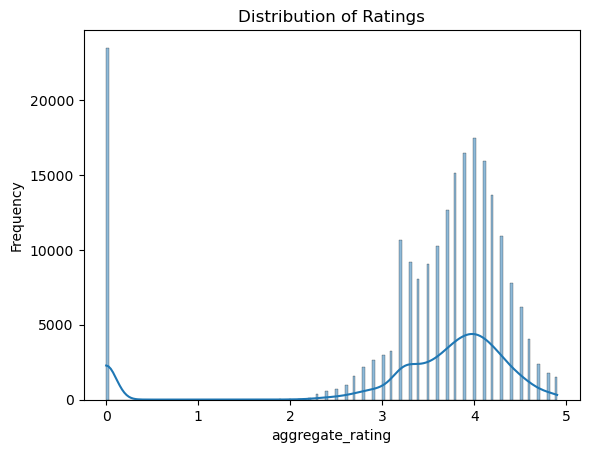

In [10]:
sns.histplot(data['aggregate_rating'], kde=True)
plt.title('Distribution of Ratings')
plt.xlabel('aggregate_rating')
plt.ylabel('Frequency')
plt.show()

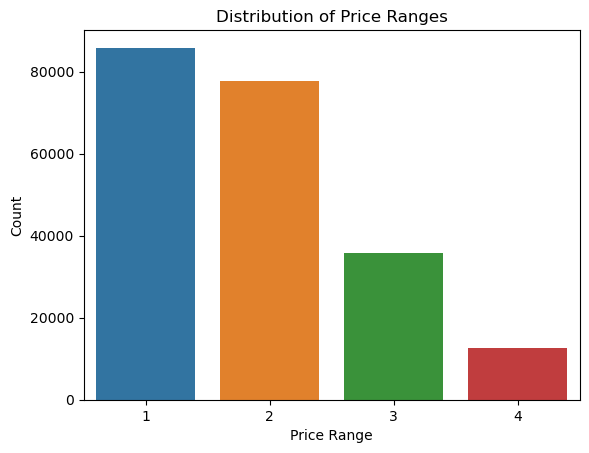

In [11]:
sns.countplot(x='price_range', data=data)
plt.title('Distribution of Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

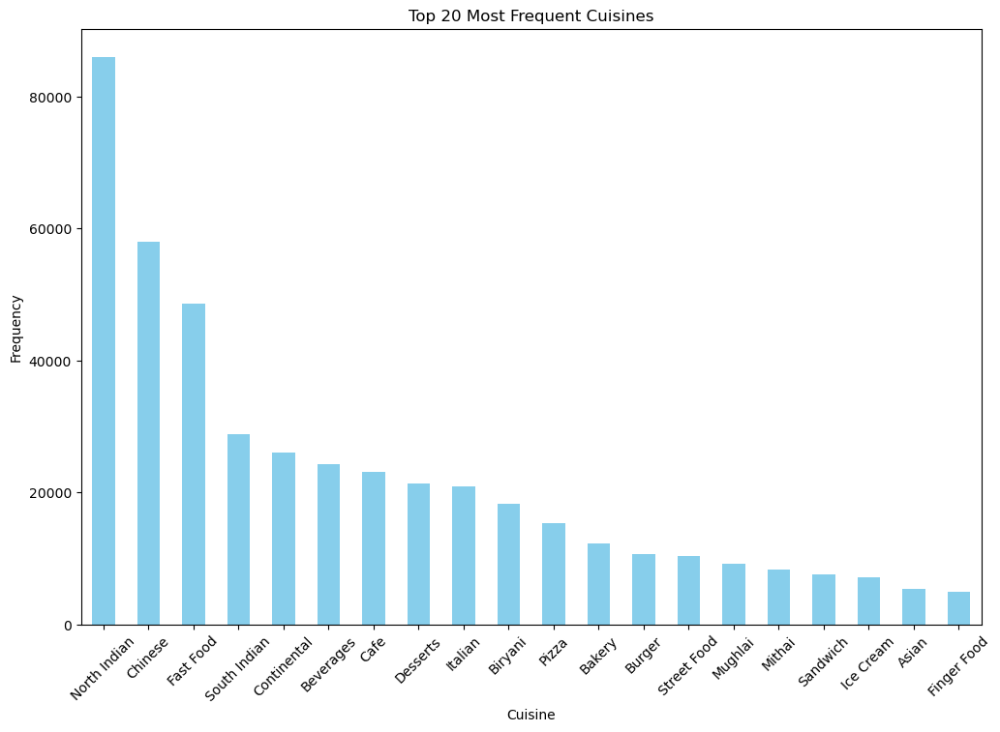

In [12]:

data['cuisines'] = data['cuisines'].fillna('Unknown')
cuisines_series = data['cuisines'].str.split(', ')
from itertools import chain
cuisine_counts = pd.Series(list(chain.from_iterable(cuisines_series))).value_counts()
top_cuisines = cuisine_counts.head(20)
plt.figure(figsize=(12, 8))
top_cuisines.plot(kind='bar', color='skyblue')
plt.title('Top 20 Most Frequent Cuisines')
plt.xlabel('Cuisine')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

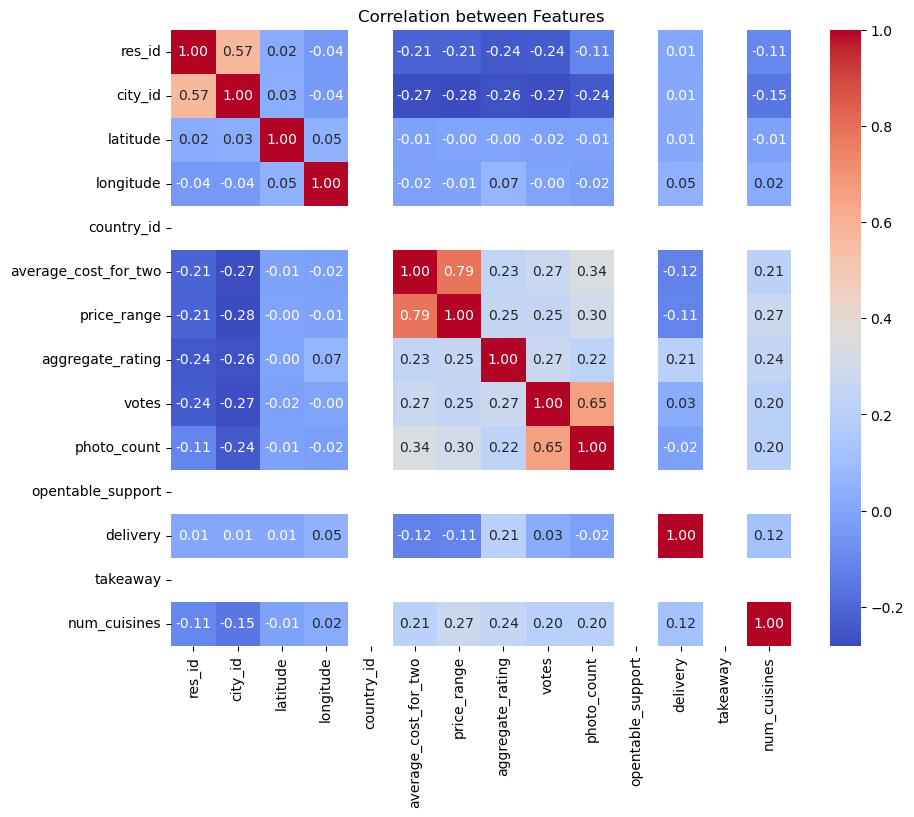

In [13]:
numeric_data = data.select_dtypes(include=['float64', 'int64'])
corr_matrix = numeric_data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation between Features')
plt.show()

## Regional Analysis

C:\Users\mahna\AppData\Local\Temp\ipykernel_29444\1818973878.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 1, 1)


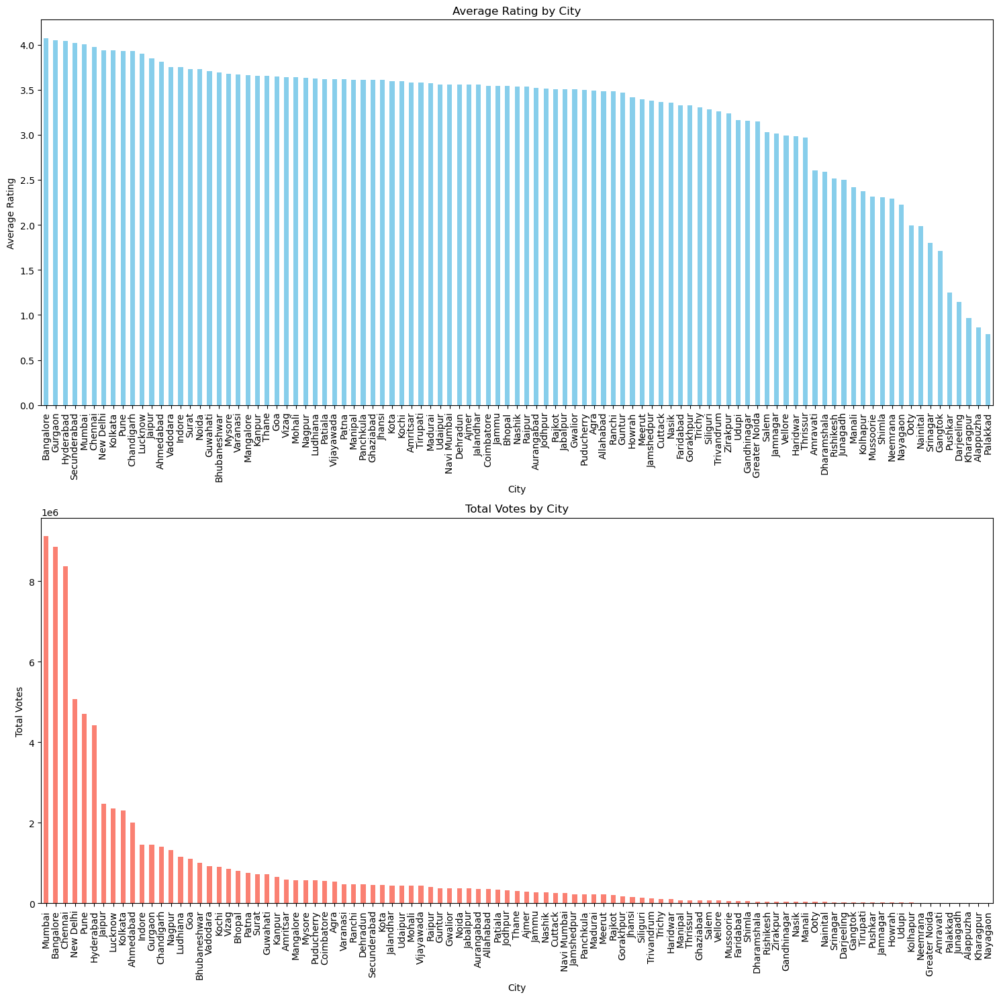

In [15]:
df = pd.DataFrame(data)

city_avg_rating = df.groupby('city')['aggregate_rating'].mean().sort_values(ascending=False)
city_votes = df.groupby('city')['votes'].sum().sort_values(ascending=False)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))

plt.subplot(2, 1, 1)
city_avg_rating.plot(kind='bar', color='skyblue')
plt.title('Average Rating by City')
plt.xlabel('City')
plt.ylabel('Average Rating')

plt.subplot(2, 1, 2)
city_votes.plot(kind='bar', color='salmon')
plt.title('Total Votes by City')
plt.xlabel('City')
plt.ylabel('Total Votes')

plt.tight_layout()
plt.show()



## Customer Preference Analysis



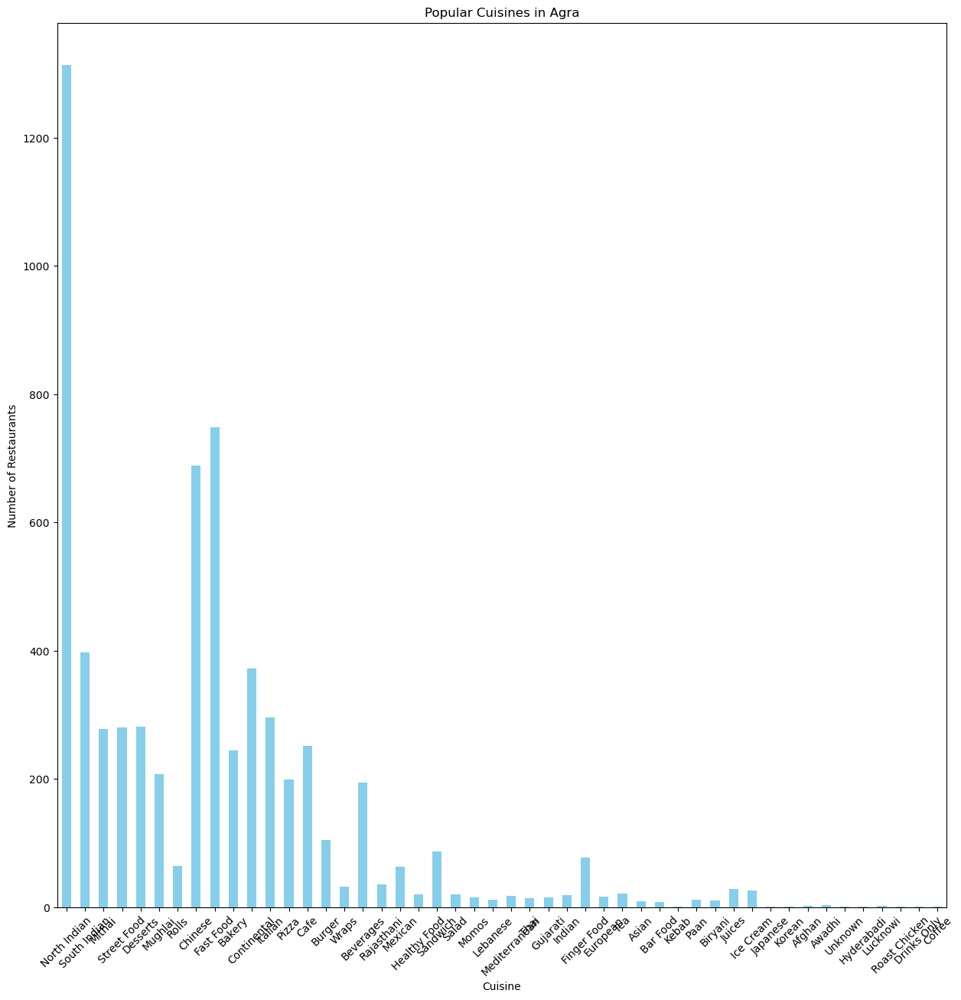

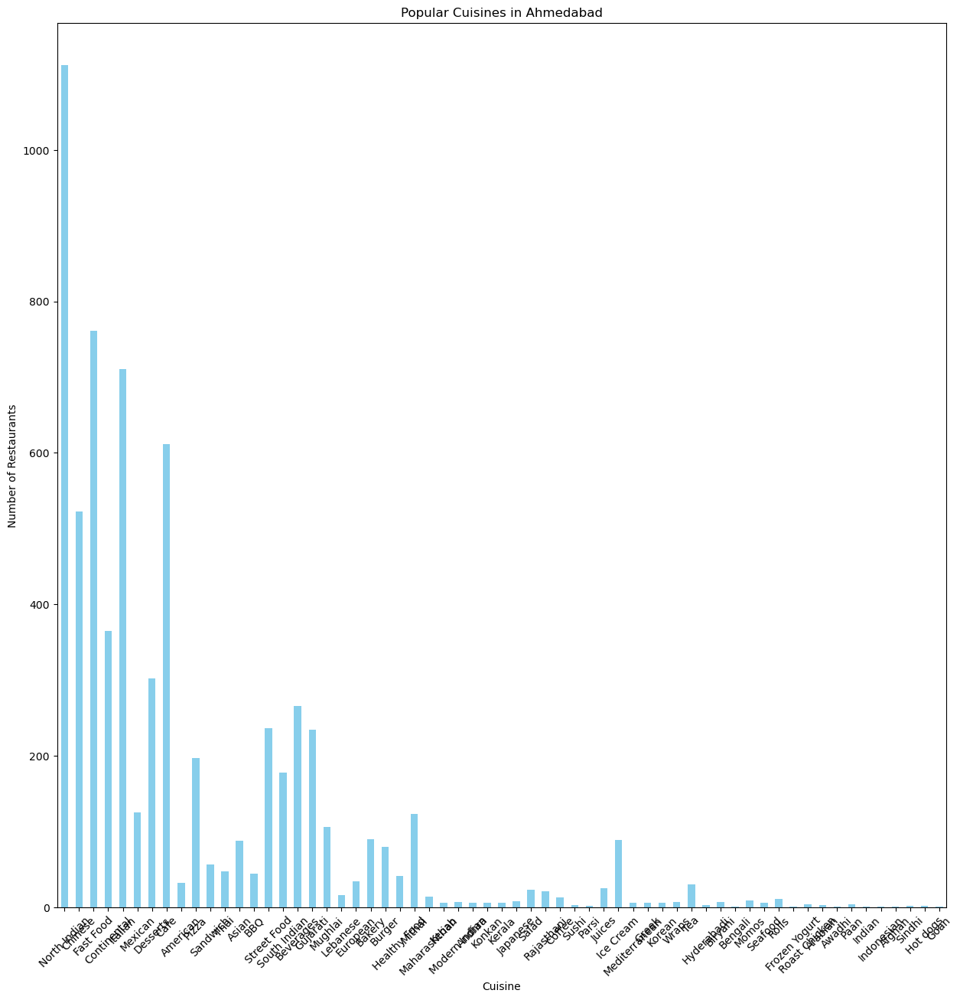

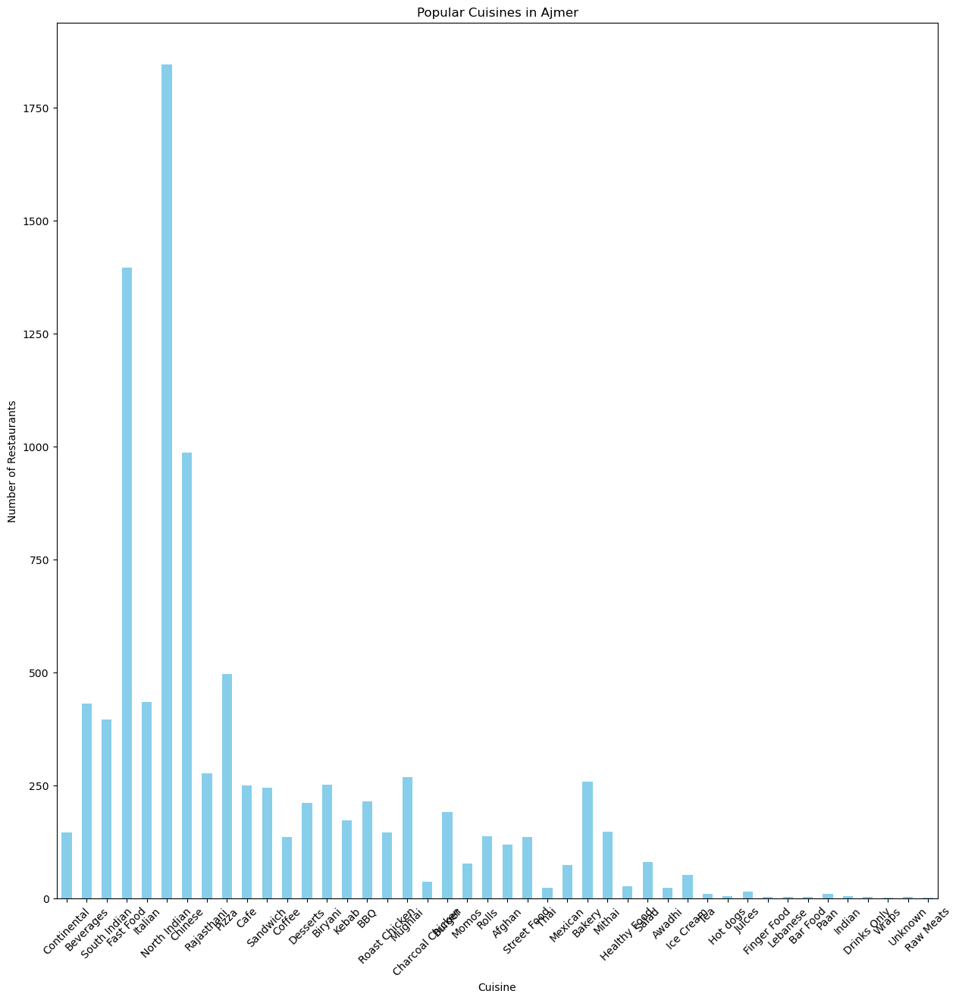

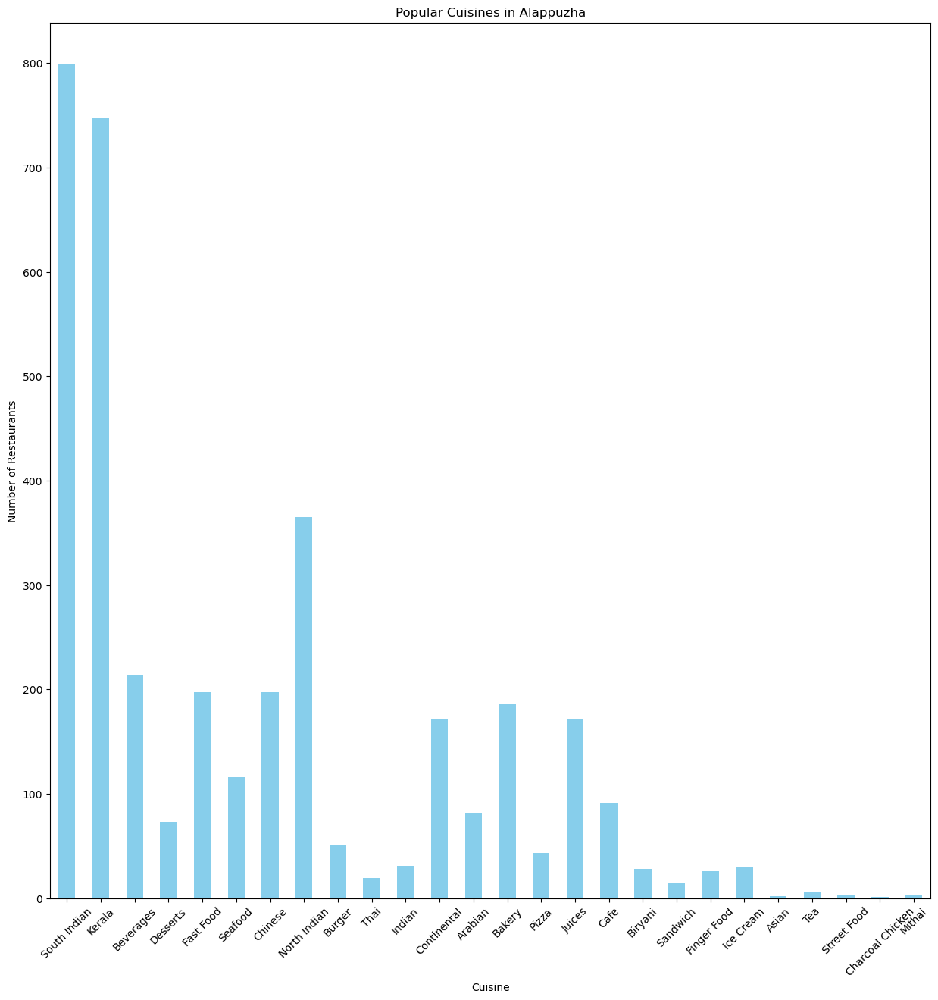

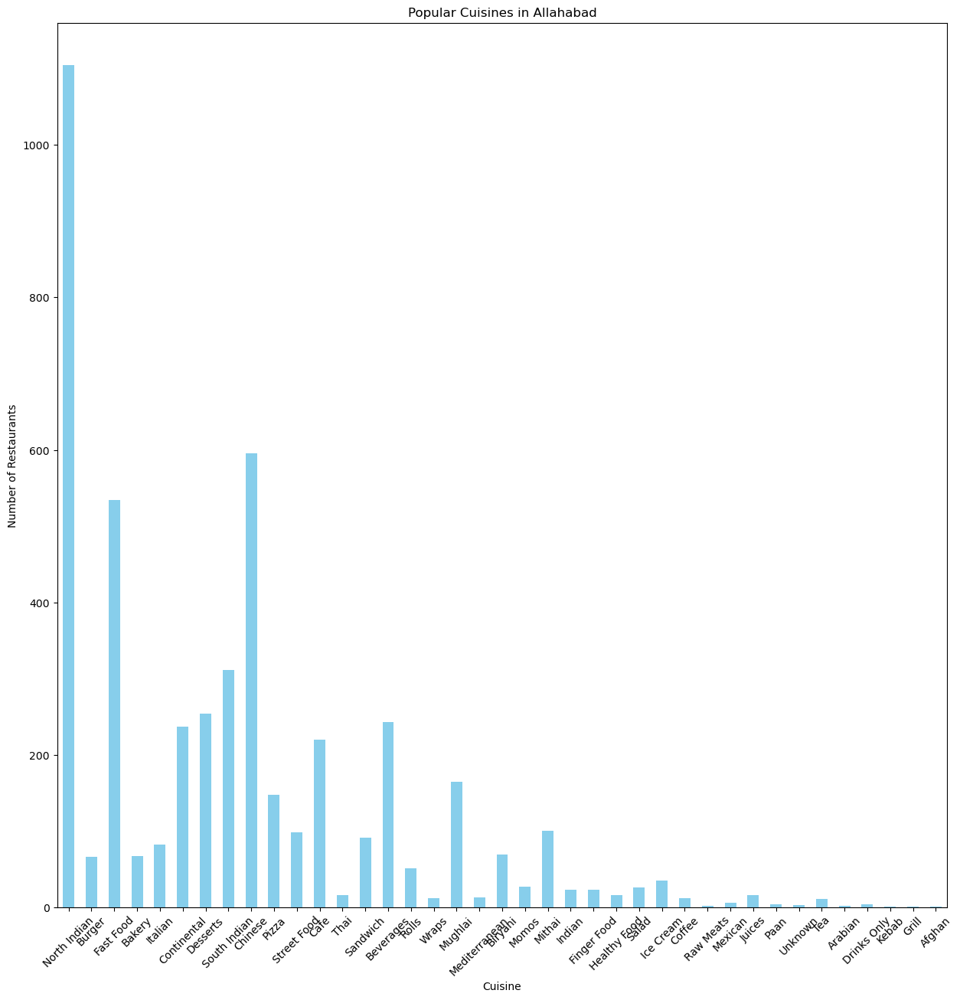

...

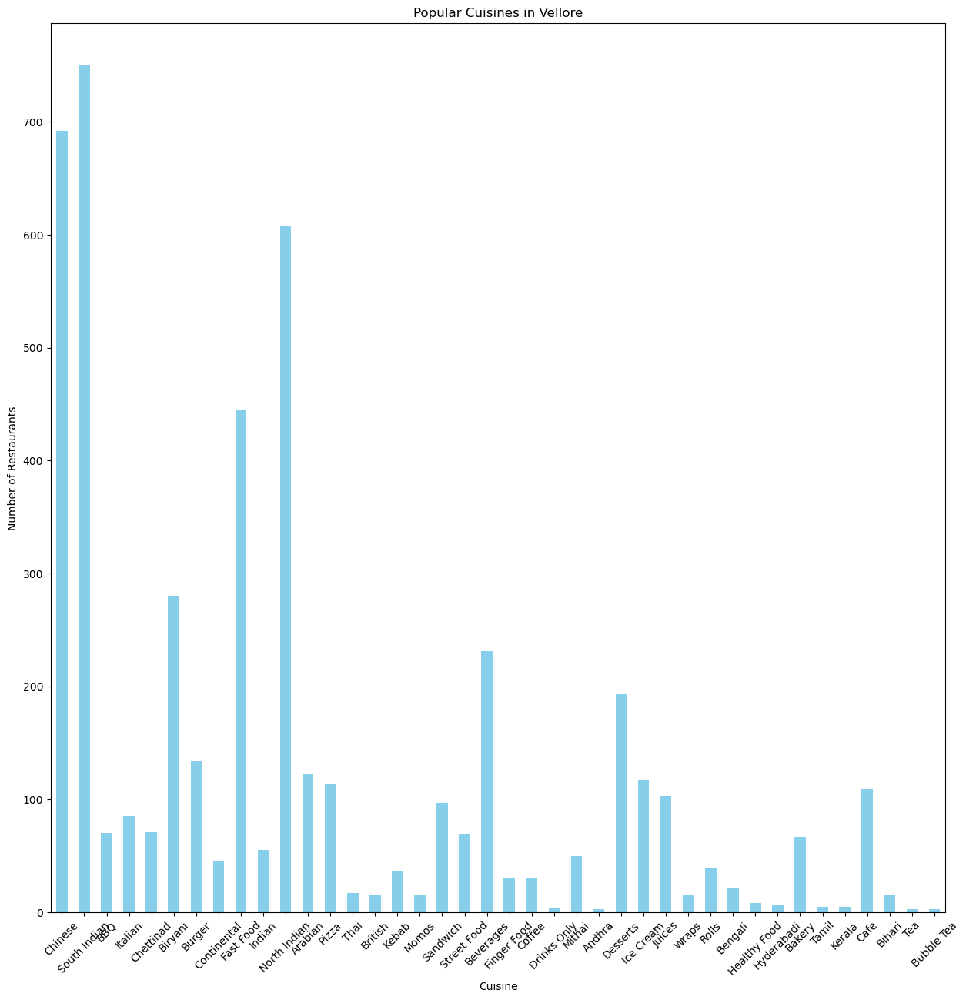

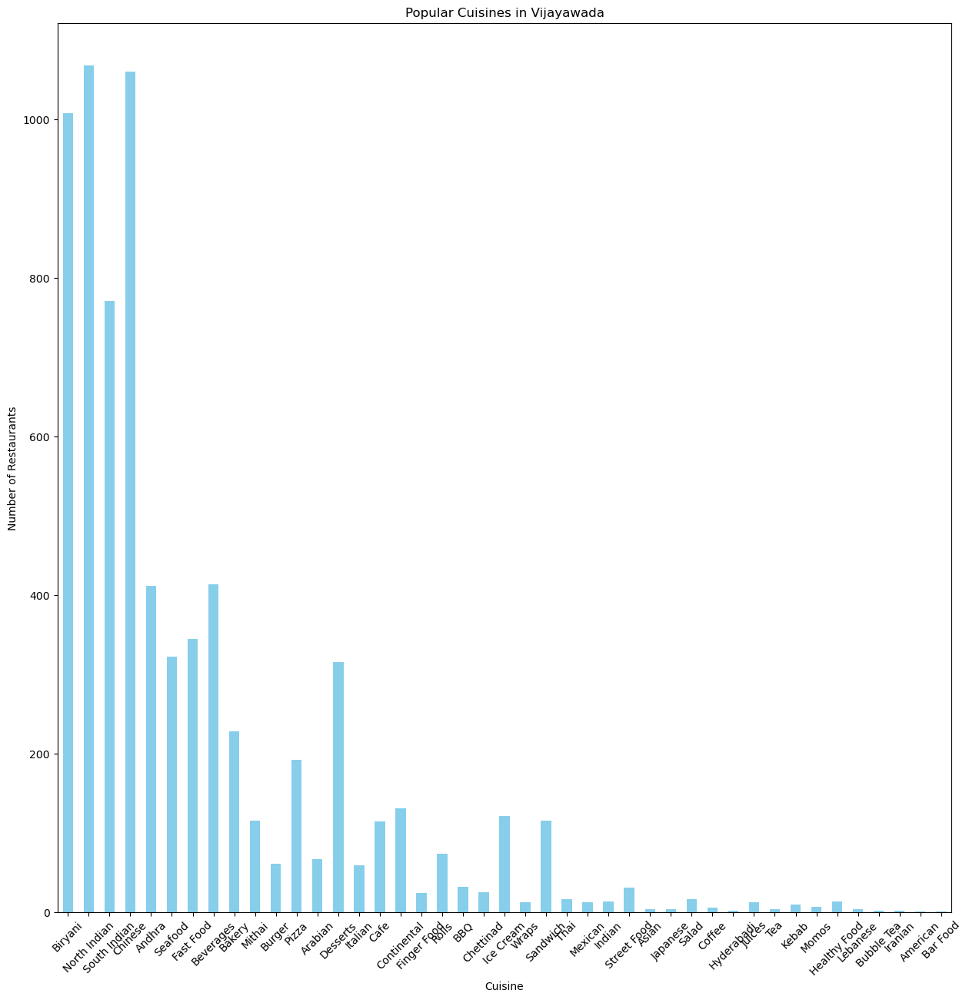

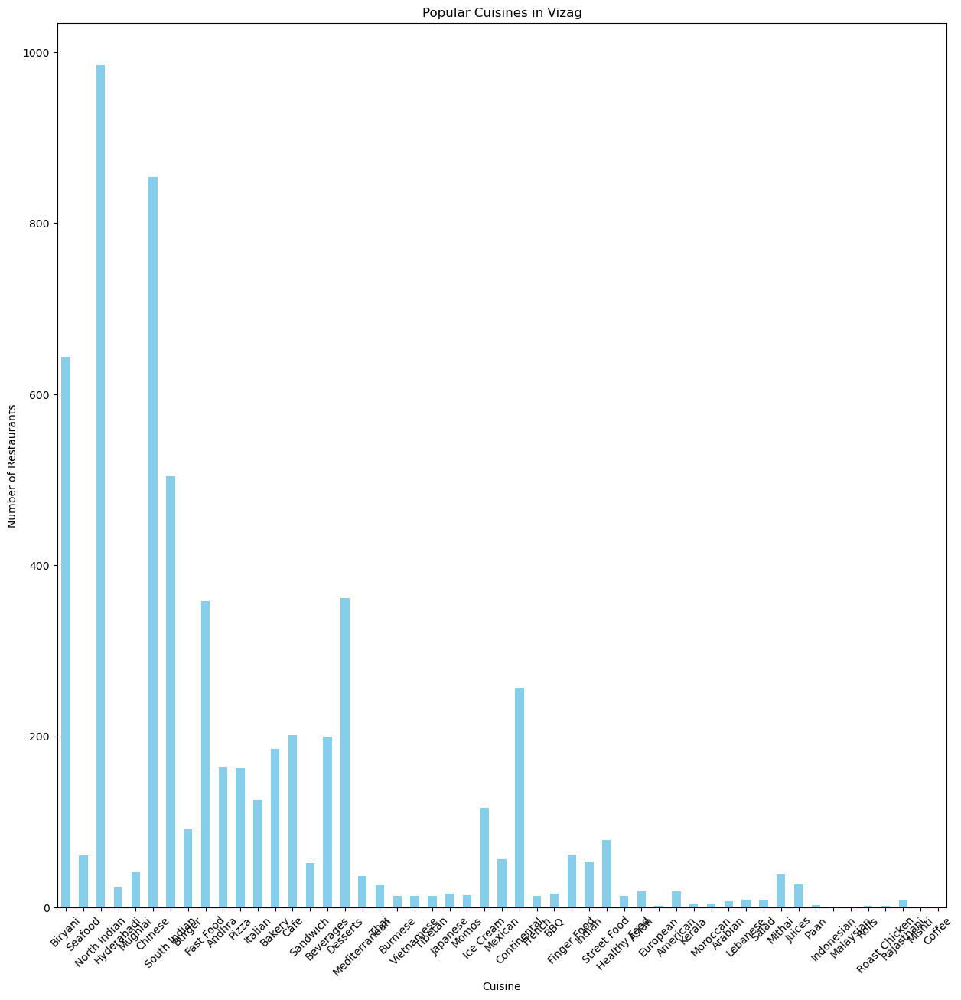

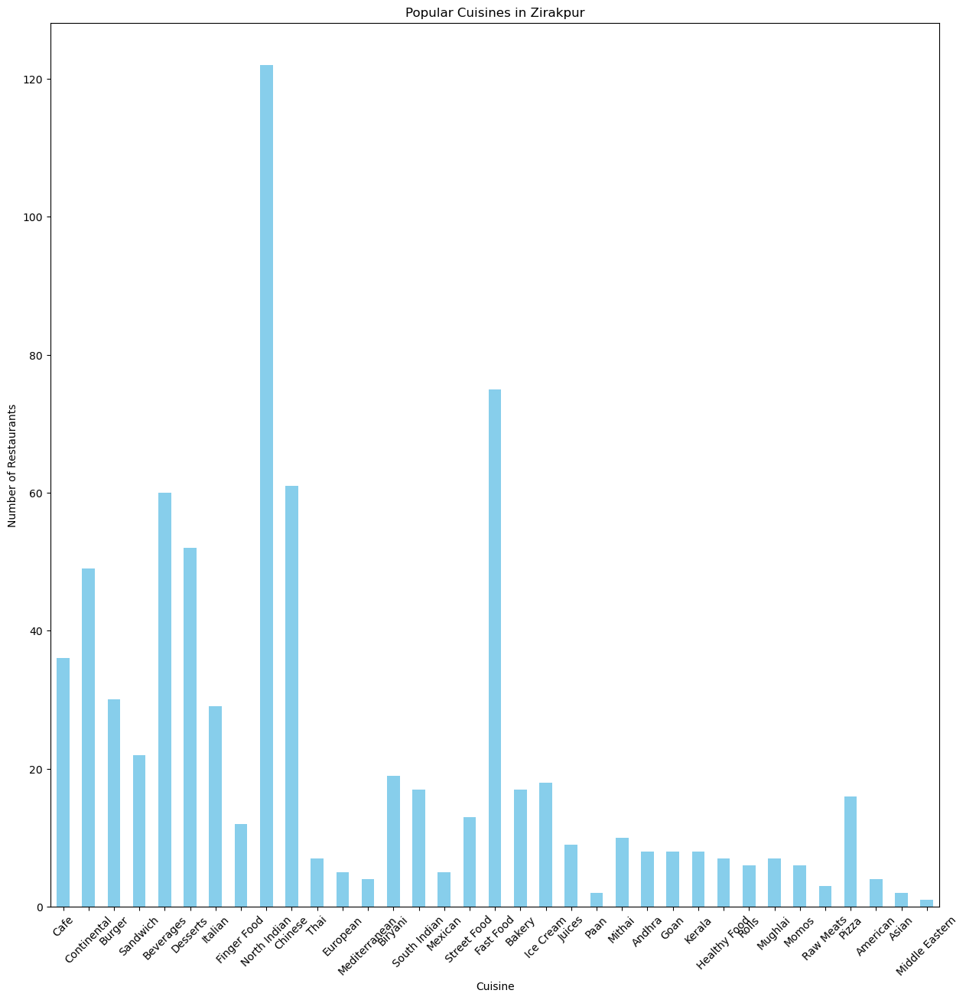

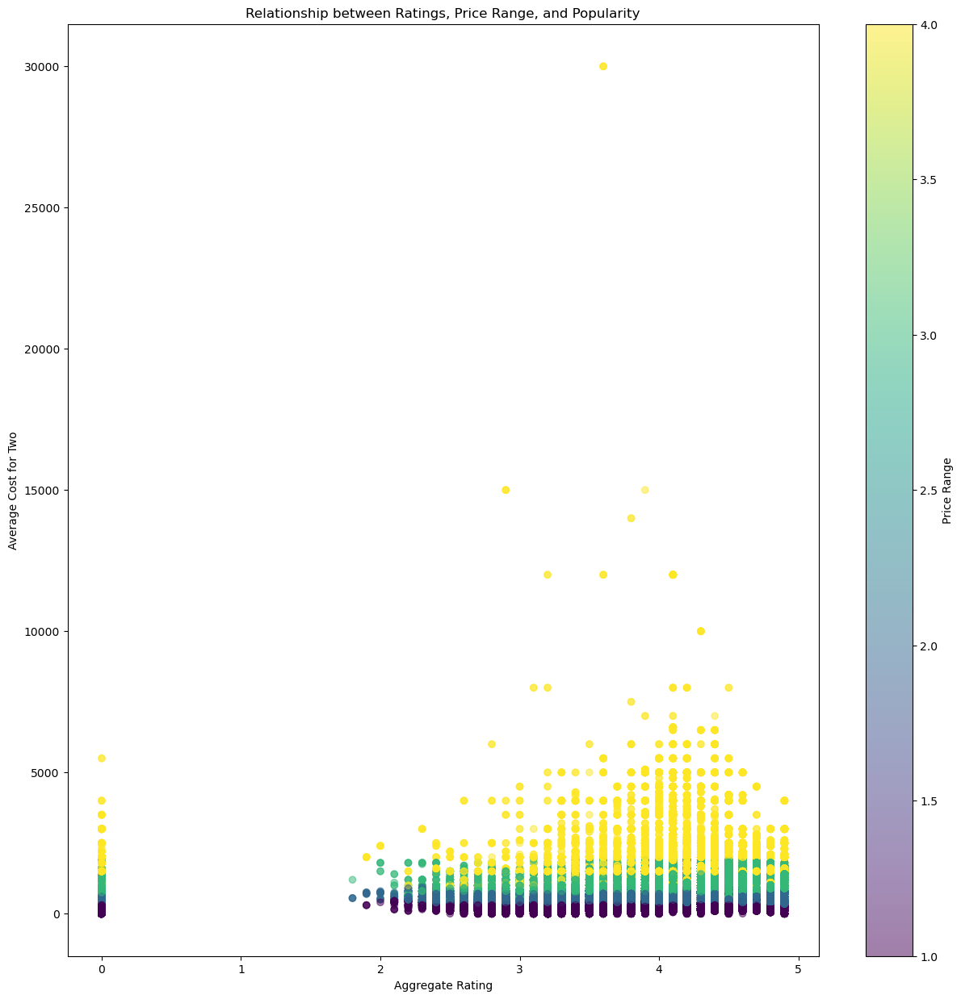

In [16]:
# Analyze the types of cuisines that are popular in different regions
def count_cuisines(region_data):
    cuisine_counts = {}
    for cuisines in region_data['cuisines']:
        for cuisine in cuisines.split(','):
            cuisine_counts[cuisine.strip()] = cuisine_counts.get(cuisine.strip(), 0) + 1
    return cuisine_counts

# Group the data by city/region and count the cuisines
city_cuisine_counts = df.groupby('city').apply(count_cuisines)

# Plot the cuisine counts for each city/region
for city, counts in city_cuisine_counts.items():
    plt.figure(figsize=(15, 15))
    counts_series = pd.Series(counts)
    counts_series.plot(kind='bar', color='skyblue')
    plt.title(f'Popular Cuisines in {city}')
    plt.xlabel('Cuisine')
    plt.ylabel('Number of Restaurants')
    plt.xticks(rotation=45)
    plt.show()

# Examine the relationship between restaurant ratings, price range, and popularity
plt.figure(figsize=(15,15))
plt.scatter(df['aggregate_rating'], df['average_cost_for_two'], c=df['price_range'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Price Range')
plt.xlabel('Aggregate Rating')
plt.ylabel('Average Cost for Two')
plt.title('Relationship between Ratings, Price Range, and Popularity')
plt.show()




## Competitive Analysis

In [20]:
# Group the data by region
region_groups = df.groupby('city')

# Dictionary to store competitors and their attributes for each region
competitors_by_region = {}

# Iterate over each region
for region, region_data in region_groups:
    print(f"Region: {region}")
    print("==================")
    
    # Sort the region data by rating in descending order
    region_data_sorted = region_data.sort_values(by='aggregate_rating', ascending=False)
    
    # Extract the top competitor
    top_competitor = region_data_sorted.iloc[0]
    print("Top Competitor:")
    print("------------------")
    print(f"Name: {top_competitor['name']}")
    print(f"Cuisine: {top_competitor['cuisines']}")
    print(f"Price Range: {top_competitor['price_range']}")
    print(f"Rating: {top_competitor['aggregate_rating']}")
    print()
    
    # Identify other competitors with similar cuisine and pricing
    similar_competitors = region_data_sorted[(region_data_sorted['cuisines'] == top_competitor['cuisines']) & 
                                             (region_data_sorted['price_range'] == top_competitor['price_range'])]
    
    # Remove the top competitor from the list
    similar_competitors = similar_competitors[similar_competitors['res_id'] != top_competitor['res_id']]
    
    print("Other Competitors:")
    print("------------------")
    for _, competitor in similar_competitors.iterrows():
        print(f"Name: {competitor['name']}")
        print(f"Cuisine: {competitor['cuisines']}")
        print(f"Price Range: {competitor['price_range']}")
        print(f"Rating: {competitor['aggregate_rating']}")
        print()
    
    # Store competitors for this region
    competitors_by_region[region] = similar_competitors

Region: Agra
Top Competitor:
------------------
Name: The Salt Cafe Kitchen & Bar
Cuisine: North Indian, Continental, Italian
Price Range: 3
Rating: 4.9

Other Competitors:
------------------
Region: Ahmedabad
Top Competitor:
------------------
Name: Yanki Sizzlers
Cuisine: Continental, Italian, Chinese, Mexican
Price Range: 3
Rating: 4.9

Other Competitors:
------------------
Region: Ajmer
Top Competitor:
------------------
Name: Mango Masala Restaurant
Cuisine: Continental, Beverages, South Indian, Fast Food, Italian, North Indian, Chinese
Price Range: 2
Rating: 4.8

Other Competitors:
------------------
Region: Alappuzha
Top Competitor:
------------------
Name: Arabian Shake
Cuisine: Beverages, Desserts, Fast Food
Price Range: 2
Rating: 4.0

Other Competitors:
------------------
Region: Allahabad
Top Competitor:
------------------
Name: Eat On
Cuisine: North Indian
Price Range: 1
Rating: 4.8

Other Competitors:
------------------
Name: Kathi Express
Cuisine: North Indian
Price Range



### Analysis of the Strengths and Weaknesses of Competitors 


To analyze the strengths and weaknesses of competitors in the restaurant industry based on your provided document, we can compare the ratings, pricing, and cuisine variety among competitors. Here's a summary based on the top competitors in different regions:

a) Strengths:
1) High Ratings: Many top competitors have high ratings, often close to 4.9, indicating strong customer satisfaction. Examples include The Salt Cafe Kitchen & Bar in Agra, and Sahib’s Barbeque by Ohri’s in Hyderabad.
2) Diverse Cuisines: Some competitors offer a wide variety of cuisines, attracting a broader customer base. For instance, Biergarten in Bangalore offers Continental, North Indian, Chinese, European, BBQ, Finger Food, and Asian cuisines.
3) Pricing Strategy: The pricing varies widely, allowing each restaurant to target different segments of the market. Some, like The Barbeque Company in Jaipur, offer mid-range pricing (3 out of 4), likely balancing quality and accessibility.

b)Weaknesses:
1) Lower Ratings Among Some Competitors: Some competitors have significantly lower ratings, such as Guru Kripa Bhojnalaya in Allahabad with ratings as low as 2.7. This might indicate issues with food quality, service, or customer experience.
2) Limited Cuisine Options: Some regions show a lack of variety in cuisines offered by top competitors. For instance, in many regions, North Indian cuisine dominates, potentially underserving fans of other cuisines.
3) Price Sensitivity: In regions with predominantly low-price ranges (e.g., 1 out of 4), there's intense competition on pricing, which could compress profit margins and limit the scope for offering higher quality options.

c)Opportunities:
1) Expanding Cuisine Variety: Offering more varied cuisines in regions dominated by one or two types could attract underserved customers.
2) Enhancing Customer Experience: In areas where competitors have low ratings, there is an opportunity to win market share by focusing on superior customer service and food quality.

d) Threats:
1) High Competition in Pricing: In regions with fierce competition on pricing, entering with a higher price point might be challenging unless differentiated by unique offerings or superior quality.
2) Market Saturation: High saturation in certain cuisine categories, like North Indian food, could pose challenges for new entrants.

This analysis suggests strategic areas for a restaurant looking to enter or expand in these markets, focusing on competitive pricing, cuisine variety, and enhancing overall customer experience to capitalize on gaps in the current market offerings.



## Market Gap Analysis

In [21]:

# Extract unique cuisines and price ranges
unique_cuisines = set(df['cuisines'].str.split(', ').explode().unique())
unique_price_ranges = df['price_range'].unique()

# Group the data by region
region_groups = df.groupby('city')

# Dictionary to store gaps in each region
gaps_by_region = {}

# Iterate over each region
for region, region_data in region_groups:
    # Extract cuisines and price ranges available in the region
    region_cuisines = set(region_data['cuisines'].str.split(', ').explode().unique())
    region_price_ranges = region_data['price_range'].unique()
    
    # Identify cuisines and price ranges that are underrepresented
    missing_cuisines = unique_cuisines - region_cuisines
    missing_price_ranges = set(unique_price_ranges) - set(region_price_ranges)
    
    # Store the gaps in the market for this region
    gaps_by_region[region] = {'Missing Cuisines': missing_cuisines, 'Missing Price Ranges': missing_price_ranges}

# Display the gaps in the market for each region
for region, gaps in gaps_by_region.items():
    print(f"Region: {region}")
    print("==================")
    print("Missing Cuisines:", ', '.join(gaps['Missing Cuisines']))
    print("Missing Price Ranges:", ', '.join(map(str, gaps['Missing Price Ranges'])))
    print()


Region: Agra
Missing Cuisines: Afghani, Nepalese, Peruvian, Raw Meats, Mishti, Swedish, Iranian, Garhwali, Sri Lankan, Mongolian, Panini, Burmese, Kerala, Frozen Yogurt, Grill, Israeli, Andhra, British, German, Coffee and Tea, Tamil, Assamese, Armenian, Charcoal Chicken, Maharashtrian, Parsi, Singaporean, Fusion, Modern Australian, Portuguese, Vegan, Bengali, Moroccan, African, Mangalorean, Egyptian, Bihari, Seafood, Modern Indian, Odia, Pan Asian, Steak, Konkan, Goan, Cuisine Varies, Naga, Himachali, Greek, Brazilian, Poké, Bohri, Cake, International, Oriental, Vietnamese, Spanish, Mandi, Turkish, Russian, Tex-Mex, South American, Pakistani, Fried Chicken, Belgian, Middle Eastern, Hot dogs, Chettinad, Malaysian, North Eastern, Bangladeshi, Kashmiri, Sindhi, French, Indonesian, Sushi, Tibetan, BBQ, Bubble Tea, Falafel, Irish, Cafe Food, Malwani, Cantonese, Crepes, American, Arabian
Missing Price Ranges: 

Region: Ahmedabad
Missing Cuisines: Belgian, Middle Eastern, Fusion, Afghani, Sin





## Marketing Strategies for Restaurants based on the Analysis


To effectively target different regions, focus on specific customer segments, and differentiate from competitors, restaurants can deploy a range of strategic and promotional tactics. Here's a detailed approach based on the competitive analysis:

a) Strategies for Targeting Different Regions
1) Urban vs. Rural: In urban areas, where the competition is likely fiercer and customers may be more trend-conscious, introduce fusion cuisines or farm-to-table concepts that can attract a foodie crowd. For rural or less densely populated areas, focus on local tastes and preferences with traditional and hearty meals, often at a lower price point to match the local economy.
2) Tourist vs. Local Areas: In tourist-heavy areas, restaurants can focus on offering local cuisines with an authentic experience, possibly incorporating cultural elements like live traditional music. For locals, creating a community feel with family-friendly dining experiences and menus that cater to local preferences can be effective.
3) High-income vs. Low-income Regions: In affluent regions, introduce premium options, such as gourmet dishes and exclusive dining experiences. In contrast, for lower-income areas, competitive pricing, hearty portion sizes, and value meals can be more appealing.

b) Focusing on Specific Customer Segments
1) Young Professionals: Offer a trendy atmosphere with modern amenities like free Wi-Fi and power outlets, alongside a menu with healthy, grab-and-go options. Evening social events like "happy hour" can draw in this crowd.
2) Families: Provide a family-friendly environment with a kids' menu, play areas, and family meal deals. Consider early bird specials and a loyalty program that offers discounts on family celebrations.
3) Health-Conscious Consumers: Incorporate a range of healthy, organic, or vegetarian/vegan options into the menu. Highlight calorie counts and nutritional information to attract this segment.

c) Differentiating from Competitors
1) Unique Selling Proposition (USP): Focus on what makes your restaurant different. This could be anything from a signature dish, an unusual cooking method, or sourcing ingredients from specific, high-quality suppliers.
2) Superior Customer Service: Train staff extensively to ensure they are knowledgeable about the menu, attentive without being intrusive, and quick to resolve any issues. Good service can significantly enhance the dining experience and encourage repeat business.
3) Atmosphere: Invest in creating a unique ambiance that can become a talking point, whether it's a themed decor, an open kitchen, or live entertainment.

d) Promotional Tactics
1) Discounts and Deals: Offer opening discounts, off-peak discounts, or bundled meal deals to attract initial traffic and off-load excess inventory during slow times.
2) Loyalty Programs: Develop a loyalty program that rewards repeat customers with points that can be redeemed for free meals, upgrades, or discounts. This encourages repeat visits and enhances customer retention.
3) Special Events and Themed Nights: Host special event nights, such as wine tasting, live music, or a "guest chef" series, which can draw in crowds and generate buzz on social media.
4) Collaborations and Partnerships: Partner with local businesses or events for cross-promotion. For example, offer discounts to event ticket holders or create special menu items related to local sports teams or community events.

By employing these strategies and promotional tactics, restaurants can effectively target the right customer segments in different regions, differentiate themselves from the competition, and build a loyal customer base.






